In [3]:
#!unzip "/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/dog-breed-identification.zip" -d "/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data"

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Multi-class dog breed Classification

This notebook buils an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub

## 1. Problem

Identifying the breed of a dog given an image of a dog.

## 2. Data

The Data we're using is from Kaggle's dog breed identification competition.
https://www.kaggle.com/competitions/dog-breed-identification

## 3. Evalutation

The evalution is a file with prediction probabilities for each dog bredd of each test images.
https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information avout the data:
* We're dealing with images (unstrustured data) so we use dee plearning/transfer learning
* 120 breeds of dogs
* 10,000+ images in the training set
* 10,000+ images in the test set

## Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [5]:
# import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.12.0
TF Hub version: 0.13.0
GPU available


## Getting our data ready - Turning into Tensors
Turning images into Tensors


In [6]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [7]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

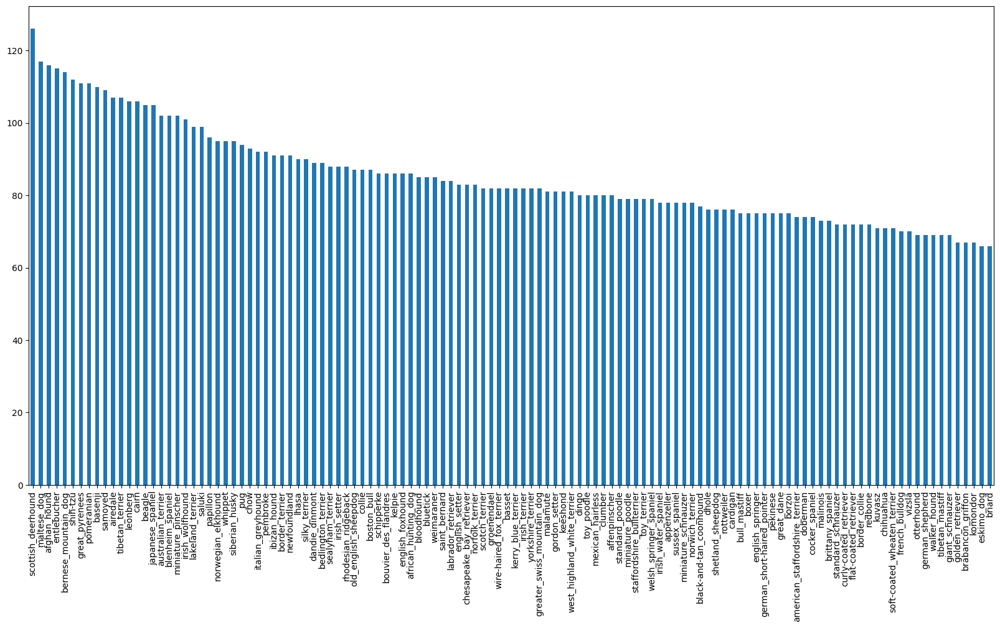

In [8]:
# How many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [9]:
labels_csv['breed'].value_counts().median()

82.0

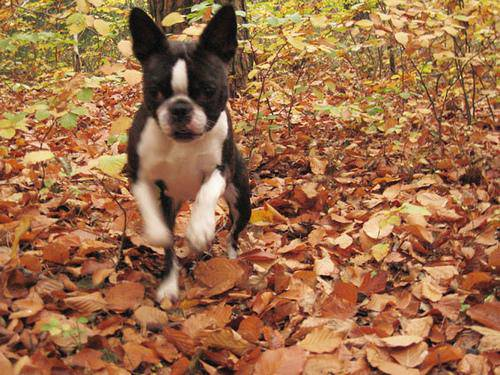

In [10]:
#View image
from IPython.display import Image
Image("drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels
Lets get a list of all our image file pathnames

In [11]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [12]:
# Create pathnames form imga ID's
filenames = ["drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/train/" + fnames + ".jpg" for fnames in labels_csv["id"]]

filenames[:10]

['drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/Dog-b

In [13]:
# Check wether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/train/")) == len(filenames):
  print("Filesnames match actual amount of files")
else:
  print("Filenames do not match actual amount of times")

Filesnames match actual amount of files


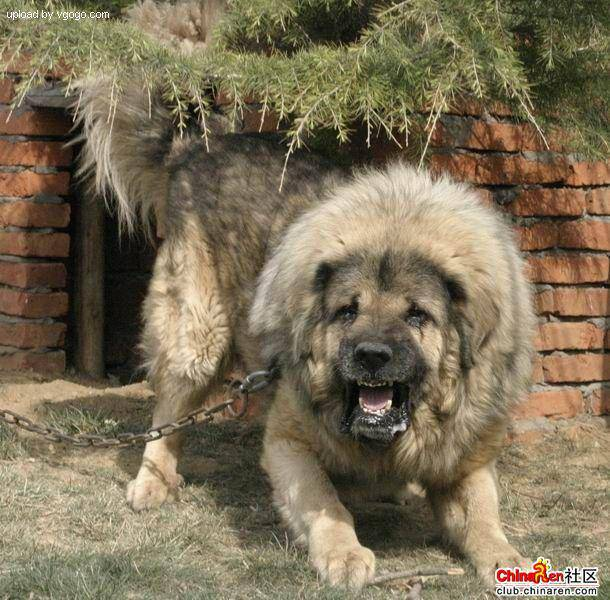

In [14]:
# One more check
Image(filenames[9000])

Let's prepare our Labels

In [21]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # do the same as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [16]:
# See if number of matches of the number of filenames
if len(labels) == len(filenames):
  print("Filesnames match actual number of labels")
else:
  print("Filenames do not match number of labels")

Filesnames match actual number of labels


In [17]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [18]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [19]:
# Trun every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [20]:
len(boolean_labels)

10222

### Creating a validation Set

In [22]:
# Setup X & y variables
X = filenames
y = boolean_labels

Start experimenting with 1000 images and increase as needed

In [23]:
# Set number of imgaes to use for experimenting
NUM_IMAGES = 5000 #@param {type:"slider", min:1000, max: 10000, step:1000}


In [24]:
# Split data into train and validation
from sklearn.model_selection import train_test_split

# Split into training and validation of total size Num_Images
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(4000, 4000, 1000, 1000)

## Preprocessing Images (turning images into Tensors)
Function to preprocess:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable `image`
3. Turn our `image` into Tensors
4. Normalize our image (convert color channel values form 0-255 to 0-1) - make computation more efficient
5. Resize the `image`to be a shape of (224, 224)
6. Return the modify `image`

In [25]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape


(257, 350, 3)

In [26]:
# Convert image into tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [27]:

# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file pathe and turns the image into a Tensor
  """

  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values - Normalization
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to desired value
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning data into batches

Why turn our data into batches?

Let's say you're trying to precess 10,000+ images in one go... they all might not fit into memory

So that's why we do about 32 (batch size) image at the time

In order to use TensorFlow effectively, we need our daa in the form of Tensor tuples which look like this:
`(image, label)`

In [28]:
# Create a simple function to return a tuple(image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [29]:
get_image_label(X[42], y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (`X` & `y`) into batches

In [30]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Suffles the data if it's training data but doesn,T suffle if it's validation data.
  Alse accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to suffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filpaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (This also turns the image path into preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch


In [31]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [32]:
# Check out the different attributes of our data btaches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand, let's visualized that

In [33]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  #Loop through 25
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Diplay an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [34]:
train_images, train_labels = next(train_data.as_numpy_iterator())


In [35]:
len(train_images), len(train_labels)

(32, 32)

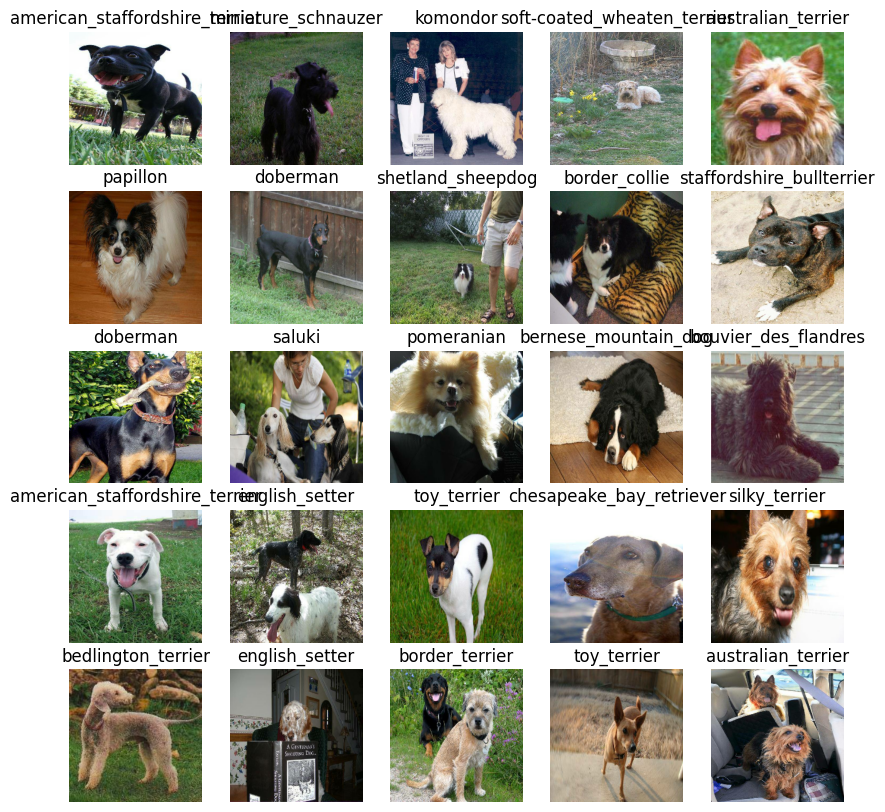

In [36]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

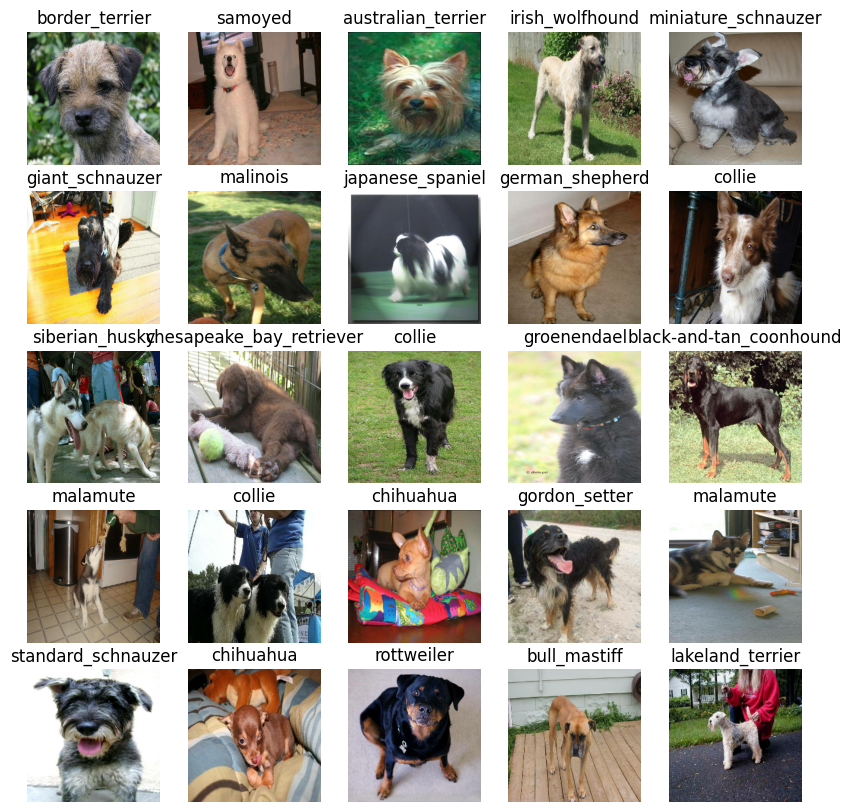

In [37]:
# Now let's visualize the data in a validation batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model
* The URL of the model we want to use. from TensorFlow Hub
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [38]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, height, width, colour channels,

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


Now we've got ou inputs, outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion ( do this first, then this, then that)
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras

In [39]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") #Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Minimize the loss - measure how well the model is doing - google how to choose a loss function
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #Build the model
  model.build(INPUT_SHAPE)

  return model



In [40]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callback are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents model from training for too long

## TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function
3. Vizualize our models training logs with the `%tensorboard` magic function (We'll do this after model training).

In [41]:
# Load TensorBoard notebook extension
%load_ext tensorboard


In [42]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a directory for storing TensorBoard callback
  logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/logs",
                        #Make it so the logs get tracket whenenver we run an experiment
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


### Early stopping callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metrics stops
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [43]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working

In [44]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [45]:
# Check for again GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train fro (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [46]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and retruns the trained version.
  """
  # Create a model
  model = create_model()

  #Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  #Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
125/125 [==============================] - 126s 746ms/step - loss: 2.2141 - accuracy: 0.5148 - val_loss: 0.9566 - val_accuracy: 0.7390
Epoch 2/100
125/125 [==============================] - 17s 134ms/step - loss: 0.4723 - accuracy: 0.8855 - val_loss: 0.7706 - val_accuracy: 0.7720
Epoch 3/100
125/125 [==============================] - 17s 134ms/step - loss: 0.2393 - accuracy: 0.9545 - val_loss: 0.7427 - val_accuracy: 0.7700
Epoch 4/100
125/125 [==============================] - 17s 135ms/step - loss: 0.1414 - accuracy: 0.9827 - val_loss: 0.7274 - val_accuracy: 0.7800
Epoch 5/100
125/125 [==============================] - 19s 153ms/step - loss: 0.0935 - accuracy: 0.9898 - val_loss: 0.7220 - val_accuracy: 0.7800
Epoch 6/100
125/125 [==============================] - 17s 134ms/step - loss: 0.0660 - accuracy: 0.9970 - val_loss: 0.7176 - val_accuracy: 0.7830
Epoch 7/100
125/125 [=========

**Question:** The model is overfitting because it's performing far better on the traing dataset than the validation dataset. What are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Pverfitting to begin with is a good thing! It means our model is learning

## Checking the TensorBoard logs

The tensorBoard magic function (`%tensorboard`) will access the los directory we created earlier and visualize it' contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Colab\ Notebooks/Dog-breed-identification/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

32/32 [==============================] - 6s 138ms/step


array([[2.4083073e-07, 2.2534226e-09, 1.1677510e-07, ..., 5.8592656e-07,
        8.2673705e-06, 7.8779529e-08],
       [3.1008510e-06, 1.4882254e-07, 3.2447542e-07, ..., 1.5016265e-09,
        2.2730175e-07, 2.5778093e-07],
       [9.1273373e-04, 2.6100515e-06, 5.0484174e-05, ..., 1.6668422e-05,
        1.9379635e-04, 1.6450728e-01],
       ...,
       [3.8460886e-08, 1.5724406e-07, 5.1856018e-06, ..., 3.1741581e-07,
        3.0812054e-04, 2.6615886e-08],
       [1.6670802e-04, 3.3502089e-05, 5.3833360e-06, ..., 1.7148683e-05,
        6.0313223e-03, 9.9679152e-04],
       [5.5245700e-08, 3.1187522e-04, 5.6743198e-07, ..., 7.0004779e-07,
        3.0419173e-07, 2.1919943e-06]], dtype=float32)

In [ ]:
# First prediction
index = 65
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")


[2.7131441e-04 1.1430046e-06 2.3523390e-07 3.0859596e-06 3.1767831e-07
 5.1220914e-04 9.5584243e-09 2.6816230e-07 5.0902531e-07 6.2276889e-10
 5.4905313e-06 1.3893051e-05 1.7509838e-10 6.7866642e-07 1.0761195e-06
 6.2733949e-07 5.6284247e-05 1.8647013e-05 2.9036780e-06 7.9713921e-08
 2.8585270e-04 1.5654675e-09 5.0912338e-05 1.0513201e-05 6.8381546e-06
 8.4339541e-07 4.3712276e-05 1.7665921e-05 2.5431564e-06 1.7546155e-07
 2.1530263e-06 1.1170040e-06 1.7704546e-05 5.6360146e-05 1.1686169e-08
 3.1206884e-05 1.2685742e-09 2.7091951e-10 4.4506419e-07 2.6427335e-07
 5.6834750e-05 3.2542285e-04 5.6267794e-08 1.0717069e-07 1.6027331e-04
 4.3613383e-07 1.9639898e-05 2.0000194e-05 3.9684847e-03 5.7418172e-05
 1.0390511e-05 1.9214961e-06 3.2946551e-07 2.5613211e-08 6.1173516e-05
 9.0136666e-08 5.5986188e-06 1.1192162e-05 4.8065805e-09 9.6827823e-01
 1.1567300e-05 7.7372053e-10 3.8125032e-07 6.1658306e-05 9.0321720e-07
 9.4736870e-06 4.4500135e-07 1.8707335e-04 8.6617412e-04 9.4697025e-06
 8.609

Having the above functionality is gread but we want to be able to do it at scale.
And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also know as confidence levels

In [48]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]



In [ ]:
# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[65])
pred_label

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth label)

In [49]:
# Create a function to unbatch a batch dataset
def unbatchify(data, test_data=False):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """

  images = []
  if test_data == False:
    labels = []

    # Loop through unbatched data
    for image, label in data.unbatch().as_numpy_iterator():
      images.append(image)
      labels.append(label)

    return images, labels
  else:
    # Loop through unbatched data
    for image in data.unbatch().as_numpy_iterator():
      images.append(image)

    return images


In [50]:
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

KeyboardInterrupt: ignored

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visual

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot

In [51]:
def plot_pred(prediction_probabilites, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilites[n], labels[n], images[n]

  # Get the pred label and true label
  pred_label = get_pred_label(pred_prob)
  true_label = get_pred_label(true_label)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format("prediction: " + pred_label,
                                    np.max(pred_prob*100),
                                    "real: " + true_label),
            color=color)


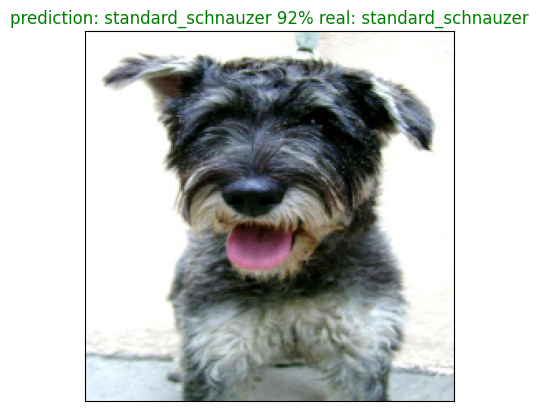

In [ ]:
plot_pred(prediction_probabilites=predictions,
          labels=val_labels,
          images=val_images,
          n=20)

from sqlalchemy.sql.expression import values
from tables import indexes
from pandas.core.arrays import integer
Now we've got on function to vizualize our models top prediction, lets' make another to view our models top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilites values
  * Prediction labels
* Plot the top 10 prediction probability values and labes , coloring the true label green

In [52]:
def plot_pred_conf(prediction_probabilites, labels, images, n=1):
  """
  Plot the top 10 hight prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilites[n], labels[n]

  # Get the predicted and true label
  pred_label = get_pred_label(pred_prob)
  true_label = get_pred_label(true_label)

  #Find the top 10 prediction confidenc indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labes
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation="vertical")

  # Change color of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass



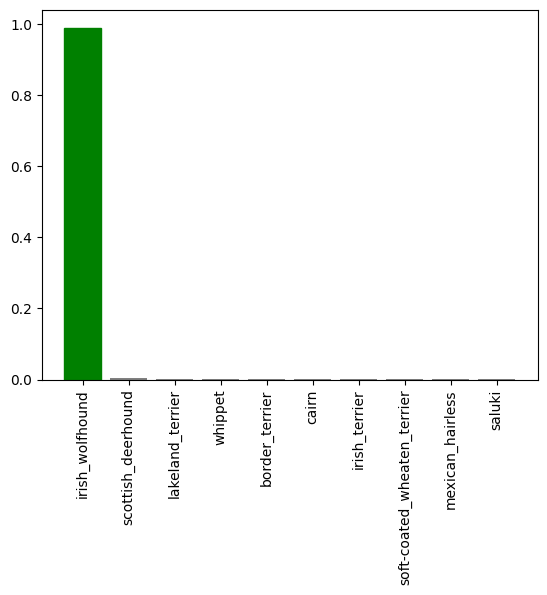

In [ ]:
plot_pred_conf(prediction_probabilites=predictions,
          labels=val_labels,
          images=val_images,
          n=3)

Now we've got some function to help us visualize our prediction and evaluate our model.

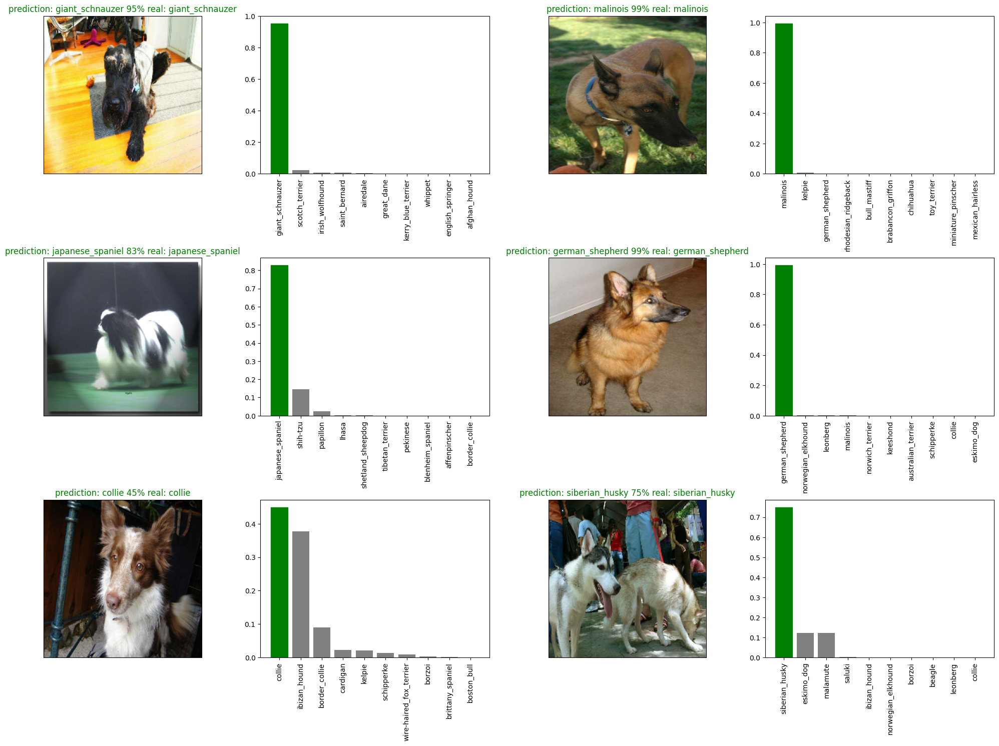

In [ ]:
# Let's check out a few prediction an their different values
i_multiplier = 5
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilites=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilites=predictions,
                 labels=val_labels,
                 images=val_images,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloadng a trained model

In [53]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffic (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" #save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [54]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Load a saved model form a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer}) # We use custom_obejcts since we've used TensorHub for transfer learning

  return model

Now we've got functions to save and load a trained model, let's make sure they work.

In [55]:
# Save our model traind on 5000 images
save_model(model, suffix="5000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/models/20230716-00261689467209-5000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/models/20230716-00261689467209-5000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_5000_image_model = load_model("/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/models/20230715-17521689443543-5000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/models/20230715-17521689443543-5000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

32/32 [==============================] - 4s 122ms/step - loss: 0.7494 - accuracy: 0.7890


[0.7493617534637451, 0.7889999747276306]

In [ ]:
# Evaluate the loaded model
loaded_5000_image_model.evaluate(val_data)

32/32 [==============================] - 5s 123ms/step - loss: 0.7494 - accuracy: 0.7890


[0.7493617534637451, 0.7889999747276306]

## Training a model on the full data

In [56]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [57]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 41s 110ms/step - loss: 1.3526 - accuracy: 0.6677
Epoch 2/100
320/320 [==============================] - 36s 111ms/step - loss: 0.4094 - accuracy: 0.8790
Epoch 3/100
320/320 [==============================] - 34s 107ms/step - loss: 0.2386 - accuracy: 0.9364
Epoch 4/100
320/320 [==============================] - 36s 111ms/step - loss: 0.1559 - accuracy: 0.9629
Epoch 5/100
320/320 [==============================] - 35s 109ms/step - loss: 0.1063 - accuracy: 0.9783
Epoch 6/100
320/320 [==============================] - 36s 114ms/step - loss: 0.0778 - accuracy: 0.9871
Epoch 7/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0587 - accuracy: 0.9913
Epoch 8/100
320/320 [==============================] - 36s 111ms/step - loss: 0.0471 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 35s 108ms/step - loss: 0.0375 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 47s 147m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/models/20230715-18191689445153-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/models/20230715-18191689445153-full-image-set-mobilenetv2-Adam.h5'

In [58]:
loaded_full_model= load_model("/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/models/20230715-18191689445153-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/models/20230715-18191689445153-full-image-set-mobilenetv2-Adam.h5


## Making prediction on test data set

Since our model has been trained on images in the form of Tensor Batches, to make prediction on the test data, we'll have to get it into the same format.
USe `create_data_batches()`

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` Since data doesn't have labels
* Make a prdiction array by passing the test batches to the `predict()` method called on our model

In [59]:
# Load test imag filenames
test_path = "/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/test/e427b9e1ab1b7f09cfb02ac073f56f2d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/test/e079440ee0061b92ec22faf17be13908.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/test/e246de79e4efd1145698d9c21466bbaf.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/test/e60f6620bf8751538db9006d425f1b45.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/test/e09859cae41cb59228518c09c3b27362.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/test/e411a1b3681604f6321af7cb8e8f2de7.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/test/e3f04efb648b110b2eb04b9c041504d8.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/test/df2ce797bf398414aac7e20119c17cb6.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/test/e635

In [60]:
len(test_filenames)

10357

In [61]:
# Create test data batch
test_data =  create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [62]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [63]:
# Make prediction on test data batch using the loaded fullmodel
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 234s 662ms/step


In [64]:
#Save Prdiciton (Numpyarray to csv fil (for access later))
np.savetxt("/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Predicted_values_of_test/preds_array.csv", test_predictions, delimiter=",")

In [65]:
# Load prediction (Numpy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Predicted_values_of_test/preds_array.csv", delimiter=",")

In [66]:
test_predictions.shape

(10357, 120)

In [67]:
test_images = unbatchify(test_data, test_data=True)
test_images[0]

array([[[0.01568628, 0.01568628, 0.01568628],
        [0.01568628, 0.01568628, 0.01568628],
        [0.01568628, 0.01568628, 0.01568628],
        ...,
        [0.09727348, 0.08435699, 0.05461514],
        [0.07717947, 0.07187641, 0.05088555],
        [0.07103466, 0.06709559, 0.04747024]],

       [[0.01568628, 0.01568628, 0.01568628],
        [0.01568628, 0.01568628, 0.01568628],
        [0.01568628, 0.01568628, 0.01568628],
        ...,
        [0.31954423, 0.30033144, 0.2638096 ],
        [0.2781442 , 0.2656134 , 0.23667018],
        [0.27205884, 0.26021537, 0.23263307]],

       [[0.01568628, 0.01568628, 0.01568628],
        [0.01568628, 0.01568628, 0.01568628],
        [0.01568628, 0.01568628, 0.01568628],
        ...,
        [0.48965192, 0.45355248, 0.4035788 ],
        [0.4870352 , 0.46200138, 0.4141285 ],
        [0.48958337, 0.46592265, 0.41873252]],

       ...,

       [[0.63534653, 0.6392681 , 0.6157387 ],
        [0.6417716 , 0.6456932 , 0.6221638 ],
        [0.6592913 , 0

In [97]:
def plot_pred_test(prediction_probabilites, images, n=0):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, image = prediction_probabilites[n], images[n]

  # Get the pred label and true label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}%".format("prediction: " + pred_label,
                                    np.max(pred_prob*100)))

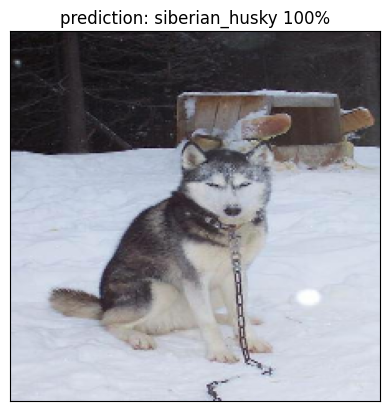

In [76]:
plot_pred_test(test_predictions, images=test_images, n=4)

## Preparing test dataset prediction for kaggle
Looking at the Kaggle sample submission, it looks like they want the models output probabilities each for label along with the image ID's.

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the unique_breeds list and the test_predictions list.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [74]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [87]:
# Append test image ID's to predictions DataFrame
test_path = "/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/test"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e427b9e1ab1b7f09cfb02ac073f56f2d,2.362009e-08,2.371344e-08,8.306068e-10,1.678472e-07,8.429559e-12,1.118248e-11,3.142843e-07,6.399192e-10,4.482441e-12,...,3.794633e-12,1.715433e-08,5.070327e-12,5.794101e-07,3.154250e-11,1.371916e-08,1.229408e-07,1.589771e-10,9.988928e-01,1.679605e-08
1,e079440ee0061b92ec22faf17be13908,4.613216e-11,5.029455e-10,8.124170e-14,1.522495e-20,4.555635e-12,4.623491e-17,2.868956e-14,5.656803e-11,5.214913e-14,...,1.785746e-11,1.903811e-12,2.739206e-14,4.450053e-12,5.316039e-12,4.832592e-14,1.050509e-08,1.190700e-15,1.320160e-13,4.918851e-15
2,e246de79e4efd1145698d9c21466bbaf,1.110466e-07,8.264975e-05,1.392215e-08,1.164700e-07,1.797521e-06,4.797654e-07,1.826643e-08,1.724975e-07,1.596781e-07,...,2.785476e-06,3.494224e-07,4.492059e-07,1.730562e-05,1.231619e-07,5.628637e-03,4.681646e-06,2.629185e-06,1.125449e-06,2.695226e-07
3,e60f6620bf8751538db9006d425f1b45,4.081034e-13,6.322111e-08,2.043791e-14,1.012792e-14,2.247197e-10,1.089786e-11,7.920311e-13,1.390591e-12,4.924052e-11,...,9.242895e-13,4.194468e-13,5.444007e-11,8.228121e-07,1.572863e-09,1.470252e-11,7.513597e-11,4.402295e-08,1.973397e-15,3.636834e-14
4,e09859cae41cb59228518c09c3b27362,2.839073e-13,1.755715e-11,2.340150e-10,1.626322e-11,1.567315e-12,3.050155e-09,5.532821e-11,3.658705e-09,1.038119e-13,...,2.651098e-12,4.860726e-09,1.259118e-12,8.533710e-08,1.421045e-09,3.458418e-11,3.807056e-10,6.019583e-11,3.300879e-09,9.905740e-11


In [88]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e427b9e1ab1b7f09cfb02ac073f56f2d,2.362009e-08,2.371344e-08,8.306068e-10,1.678472e-07,8.429559e-12,1.118248e-11,3.142843e-07,6.399192e-10,4.482441e-12,...,3.794633e-12,1.715433e-08,5.070327e-12,5.794101e-07,3.154250e-11,1.371916e-08,1.229408e-07,1.589771e-10,9.988928e-01,1.679605e-08
1,e079440ee0061b92ec22faf17be13908,4.613216e-11,5.029455e-10,8.124170e-14,1.522495e-20,4.555635e-12,4.623491e-17,2.868956e-14,5.656803e-11,5.214913e-14,...,1.785746e-11,1.903811e-12,2.739206e-14,4.450053e-12,5.316039e-12,4.832592e-14,1.050509e-08,1.190700e-15,1.320160e-13,4.918851e-15
2,e246de79e4efd1145698d9c21466bbaf,1.110466e-07,8.264975e-05,1.392215e-08,1.164700e-07,1.797521e-06,4.797654e-07,1.826643e-08,1.724975e-07,1.596781e-07,...,2.785476e-06,3.494224e-07,4.492059e-07,1.730562e-05,1.231619e-07,5.628637e-03,4.681646e-06,2.629185e-06,1.125449e-06,2.695226e-07
3,e60f6620bf8751538db9006d425f1b45,4.081034e-13,6.322111e-08,2.043791e-14,1.012792e-14,2.247197e-10,1.089786e-11,7.920311e-13,1.390591e-12,4.924052e-11,...,9.242895e-13,4.194468e-13,5.444007e-11,8.228121e-07,1.572863e-09,1.470252e-11,7.513597e-11,4.402295e-08,1.973397e-15,3.636834e-14
4,e09859cae41cb59228518c09c3b27362,2.839073e-13,1.755715e-11,2.340150e-10,1.626322e-11,1.567315e-12,3.050155e-09,5.532821e-11,3.658705e-09,1.038119e-13,...,2.651098e-12,4.860726e-09,1.259118e-12,8.533710e-08,1.421045e-09,3.458418e-11,3.807056e-10,6.019583e-11,3.300879e-09,9.905740e-11


In [89]:
# Save data to csv to kaggle
preds_df.to_csv("/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Predicted_values_of_test/full_submission_1_mobilienetV2_adam.csv",
                 index=False)

In [90]:
len(preds_df)

10357

## Making prediction on our image

To make prediction on custom images, we'll:
* Get the fle paths of our own images
* Turn the files paths into data batches using `create_data_batches()`
* Pass the custom image data batch to our models `predict`
* COnvert the prediction output probabilities to predicition labels
* Compare the predicted labels to the custom images


In [116]:
custom_path = "/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/My_dog_images/"
custom_filenames = [custom_path + fname for fname in os.listdir(custom_path)]

# Create custom data batch
custom_data =  create_data_batches(custom_filenames, test_data=True)
custom_filenames

Creating test data batches...


['/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/My_dog_images/rottweilers.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/My_dog_images/reverse_dalamtian.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/My_dog_images/dalmatian.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/Data/My_dog_images/chihuahua-1.jpg']

In [117]:
# Make prediction on test data batch using the loaded fullmodel
custom_predictions = loaded_full_model.predict(custom_data,
                                               verbose=1)

1/1 [==============================] - 1s 1s/step


In [118]:
custom_images = unbatchify(custom_data, test_data=True)

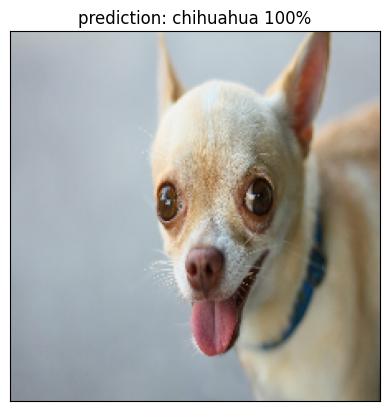

In [119]:
plot_pred_test(custom_predictions, images=custom_images, n=3)